# LAB 3

In [3]:
%matplotlib inline
from IPython.display import Image
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from decimal import Decimal
import scipy.optimize
import seaborn as sns
from IPython.display import Image
import math

## PART 1

W1 to Resistor_b to Cap_B to ground. 1+ connected to Cap_B. 1- connected to ground.

The first part of the lab is to measure the RC of an RC circuit with unknown values. The goal is to do this, not with a DMM, with waveforms. I am going to use W1 to to generat a square wave at 500 Hz. I am not really sure what to expect, but hopefully the results will give me guidance.

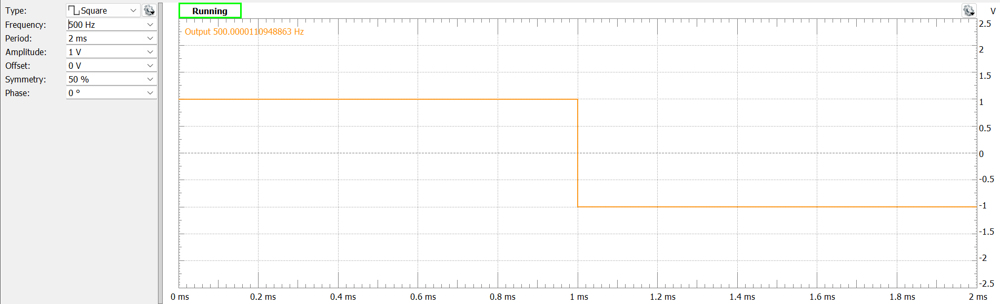

In [8]:
Image("LAB3_1.png")

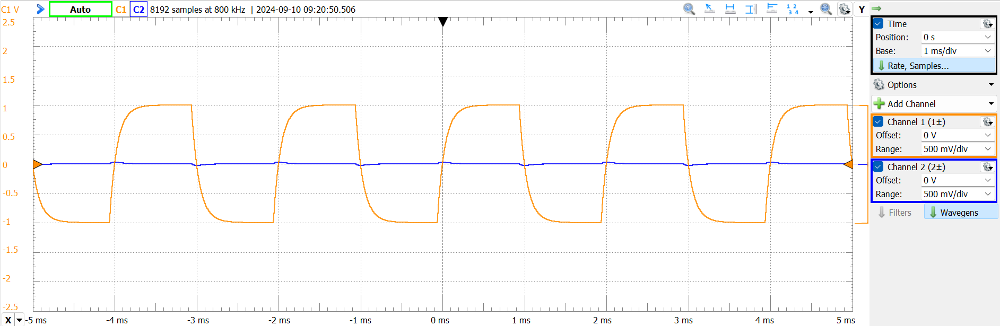

In [9]:
Image("LAB3_2.png")

This wavegen looks readable but I find that running the square wave of 150 hz gives a closer look at the wave pattern.

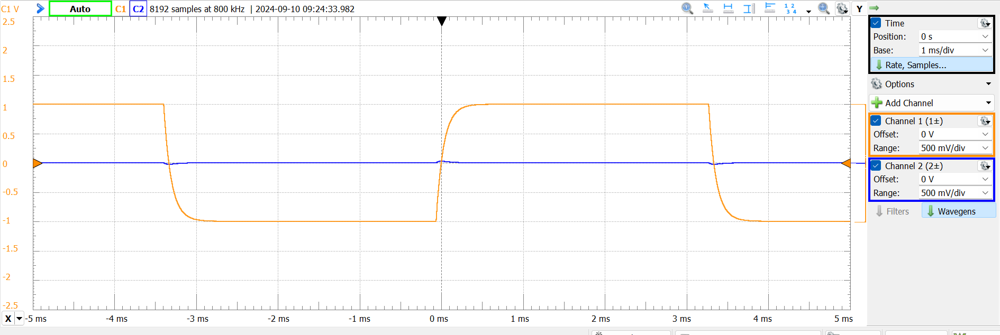

In [11]:
Image("LAB3_3.png")

I want to measure the time it takes for the output to drop to 37% (=1/e). This can be done in waveforms. I can use the quick measure tools to measure the time it takes for the Voltage output to drop to 37% (-.26 V).

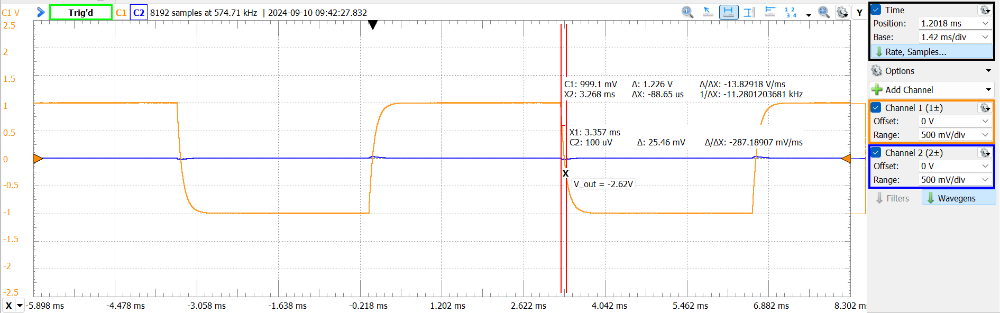

In [13]:
Image("LAB3_4.png")

## Note: the V_out label is supposed to be -0.26 V.

By using the vertical measurement, I can place a label at the approximate V_out value I am looking for. After the label is placed, i can used the horizontal measurement tool to find the time between max value and 37% value. In the picture the label was placed at approximately -0.2629 V

Here, I find that the 37% charge time is 88.65 us.

After that, I want to measure the timeb to climb from fully discharged (-1V) to 63% charged (.26V). The following scope picture is what we get:

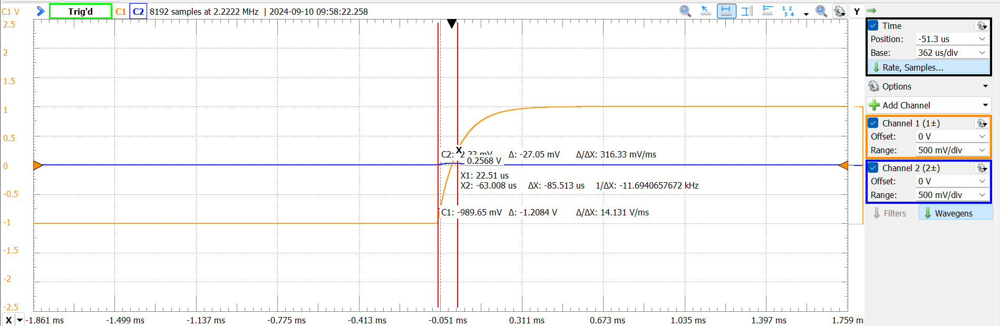

In [16]:
Image("LAB3_5.png")

Here, the change in time is 85.5 us from y=-1V to y=0.2568V. This is very similar to the time it took to discharge to 37%. Because the values for "y" used are slightly different, I assume the true RC lies somewhere between 
85.5 - 88.65(us).

### Control resistor is 986 Ohms 

Now, I want to "disentangle R and C". I will do this by treating the mystery parts as a "black box". The circuit below shows how this is accomplished. The circuit will be driven with a sine wave.

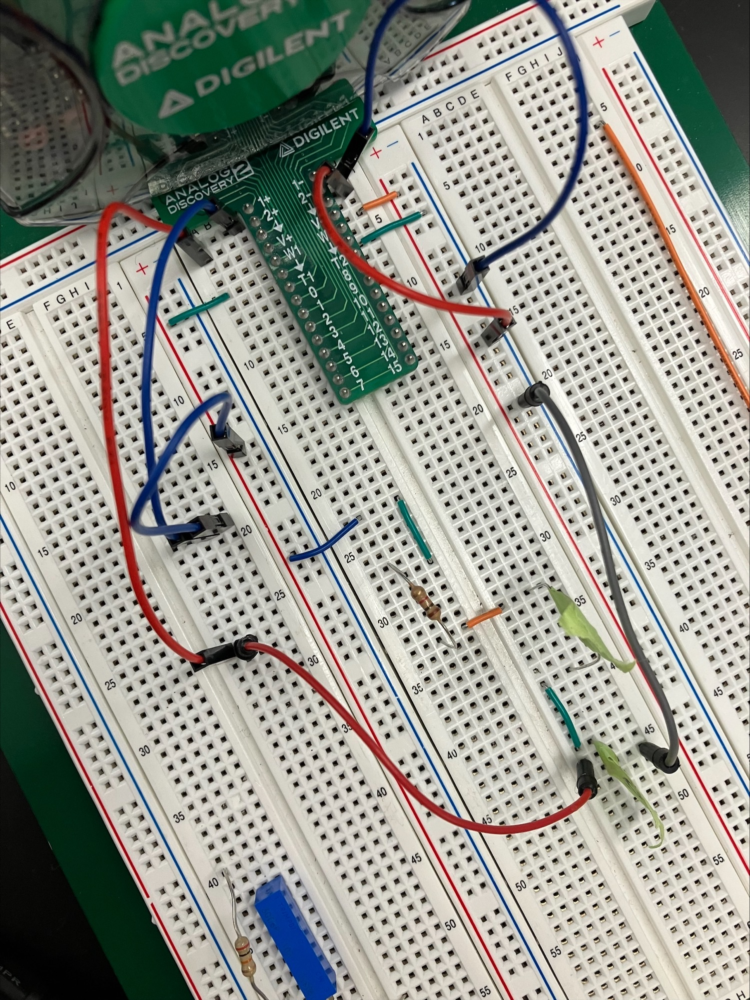

In [28]:
Image("LAB4_CIRC-1.jpeg")

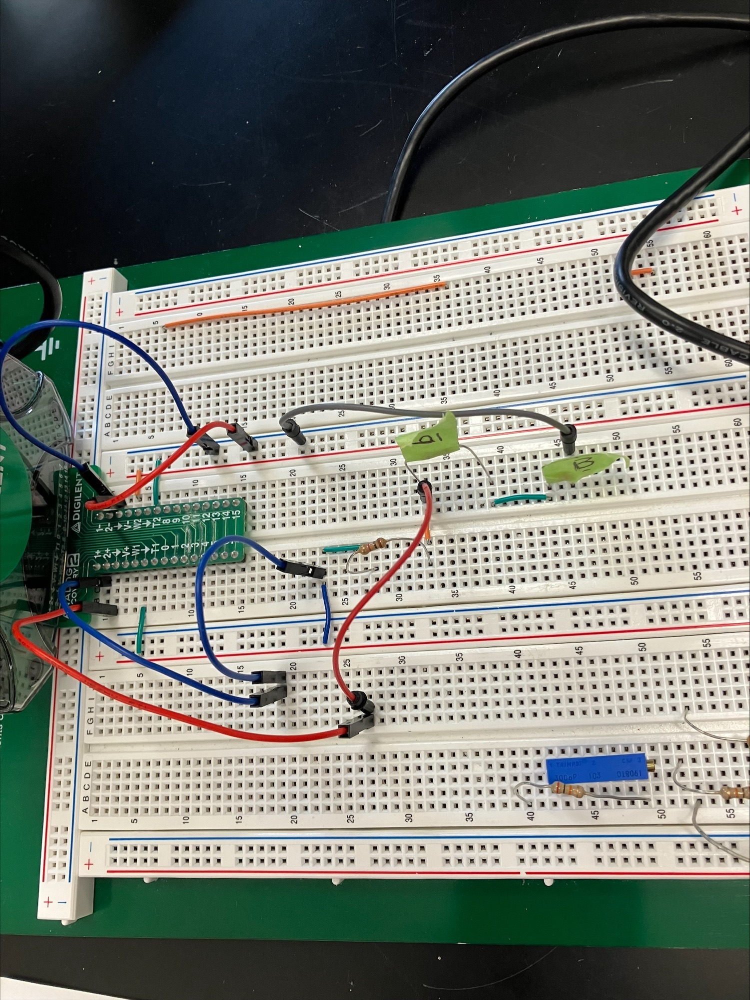

In [30]:
Image("LAB4_CIRC-2.jpeg")

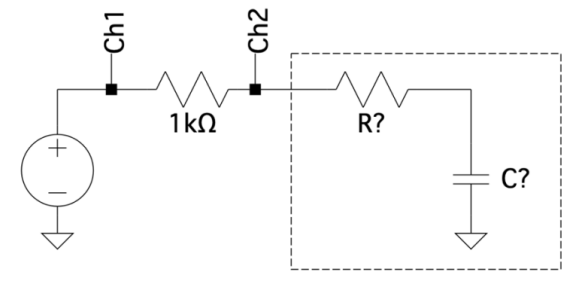

In [21]:
Image("LAB3_6.png")

Before I measure anything, I need to creat a theoretical voltage at Ch2. This will be in terms of V_in, known resistance, unknown resistance, and the unknown capacitance.

### Note: Resistor is (b) and Cap is (B)

In [25]:
def V_D(V_in, R_know, Z_r, Z_c):
    V_ch2 = V_in * ((Z_r+Z_c)/(R_know+(Z_r+Z_c)))
    return V_ch2

$$ Z_c = 1/(jwl) $$

At really high frequencies, Z_c = 0. With this in mind, we get a new equation.

In [35]:
def V_DD(V_in, R_know, Z_r):
    V_ch2 = V_in *(Z_r/(R_known + Z_r))
    return V_ch2

### Here is the code for the characteristic frequency

In [38]:
def W_c(R, C):
    W_c = 1/(R*C)
    return W

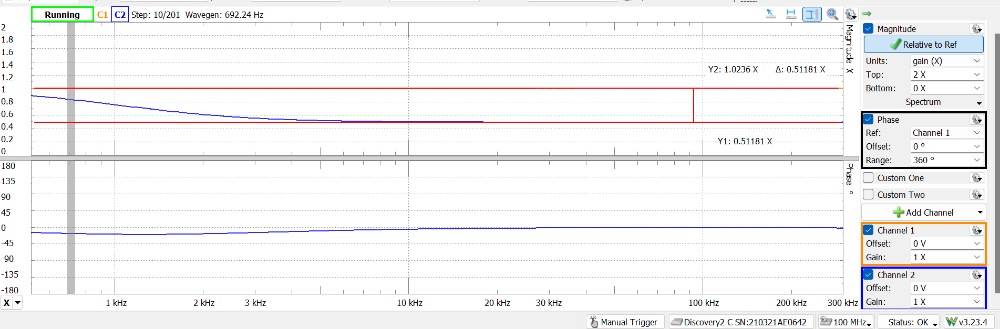

In [40]:
Image("LAB3_7.png")

- in the photo, Y1 is equal to 0.51181V and Y2 is 1.0236V. Y1 is the V_ch2 and Y2 is the Voltage at the source. Using this information, we use a rearranged version of the equations we have. The resistor being used measured at 987 ohms.

In [45]:
def V_F(R_know, V_in, V_2):
    R_m = ( ((R_know*V_2)/(V_in)) / (1 - V_2/V_in) )
    return R_m

In [47]:
R_know = 984
V_in = 1.0236
V_2 = 0.51181
print(V_F(R_know, V_in, V_2))

984.0384532718496


Now, we can find the Capacitance. We know that our RC value is between 85.5 - 88.65 microseconds. We also know that our resistor is 987.039 Ohms

In [50]:
C_1 = 85.5e-6/984.0384532718496
C_2 = 88.65e-6/984.0384532718496
print(C_1)
print(C_2)

8.688684849227111e-08
9.008794291040742e-08


# Differentiator

According to Wikepedia:
"The differentiator circuit is essentially a high-pass filter. It can generate a square wave from a triangle wave input and produce alternating-direction voltage spikes when a square wave is applied. In ideal cases, a differentiator reverses the effects of an integrator on a waveform, and conversely."
What I take away from this is that, if I drive a triangle wave into the cirucit, I should see a square wave on my scope.

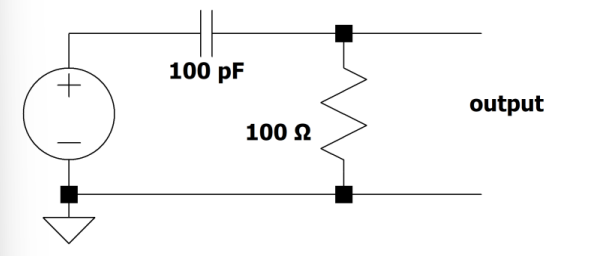

In [54]:
Image("LAB3_8.png")

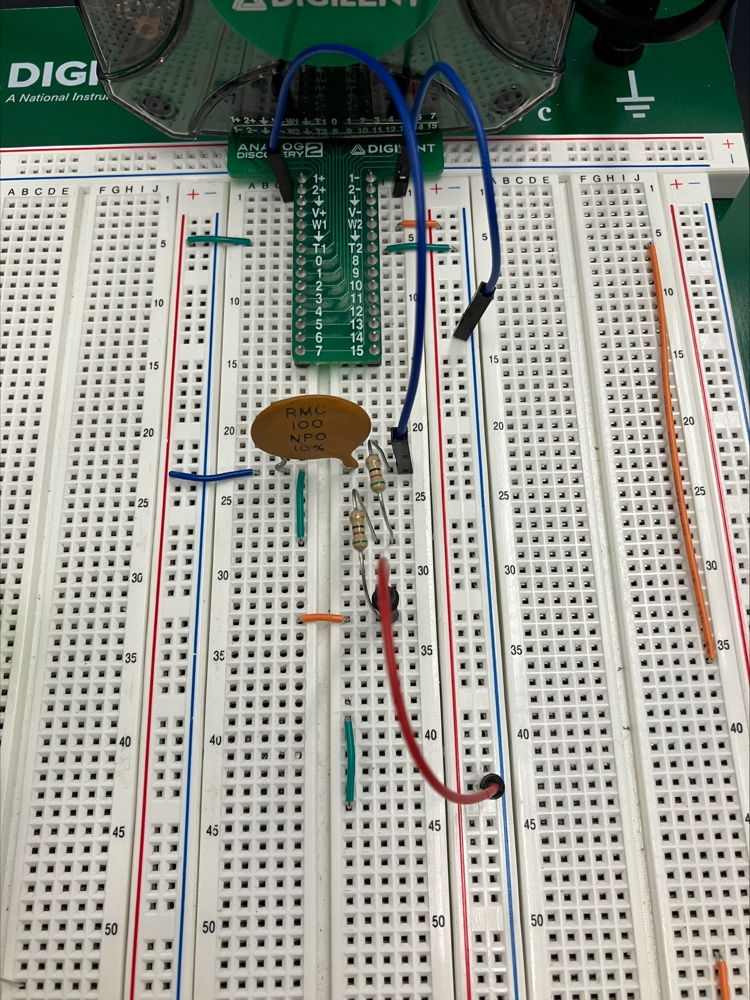

In [32]:
Image("LAB4_CIRC-3.jpeg")

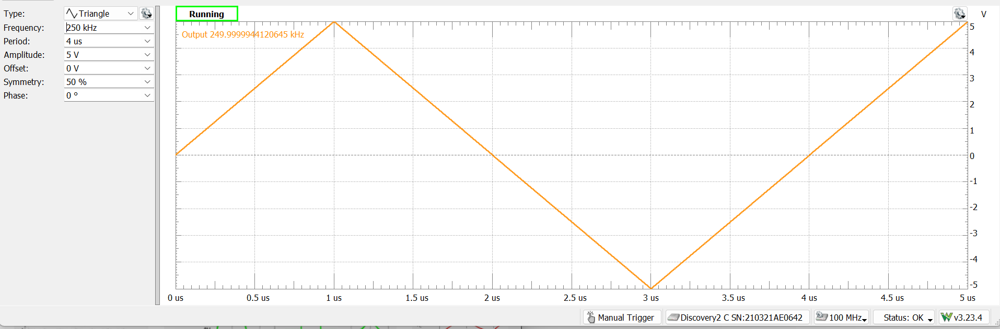

In [57]:
Image("LAB3_9.png")

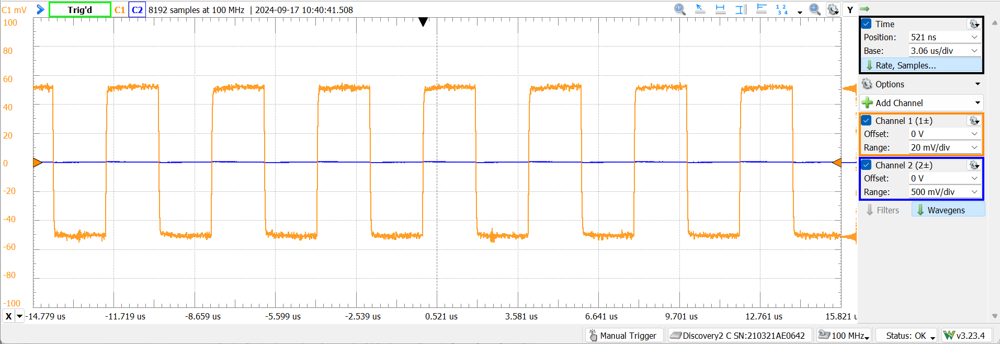

In [59]:
Image("LAB3_10.png")

By driving a triangle wave into the circuit, the channel one scope develops a square wave. This proves that the circuit does in fact act as a differentiator.

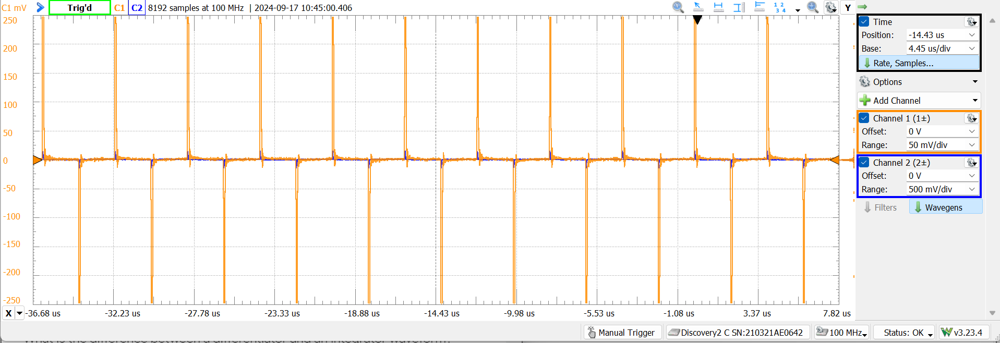

In [62]:
Image("LAB3_11.png")

When switching the wave type to a square wave, I expect to see alternating voltage spikes. Above is a screenshot of the alternating voltage spikes. 
This further proves that the circuit behaves as a differentiator.
This happens becacause a square wave's slope is mostly zero with sudden spikes when the wave switches between negative and positive.

It makes sense that a "differentiator" would show a triangle wave as a square wave. This is because the derivative of a triangle graph looks like a square graph. I want to see if the resulting square wave has an exact differential of the triangle wave or if there is a "lag".

By running the same triangle wave as above, I can see that the slope of the triangle wave at 1us and 3us is zero. The pattern of the resulting differetnial wave should be zero at 1us, then negative, then zero at 3us, then positive.
T=[1,x,3,y]
V=[0,-,0,+]

### Results

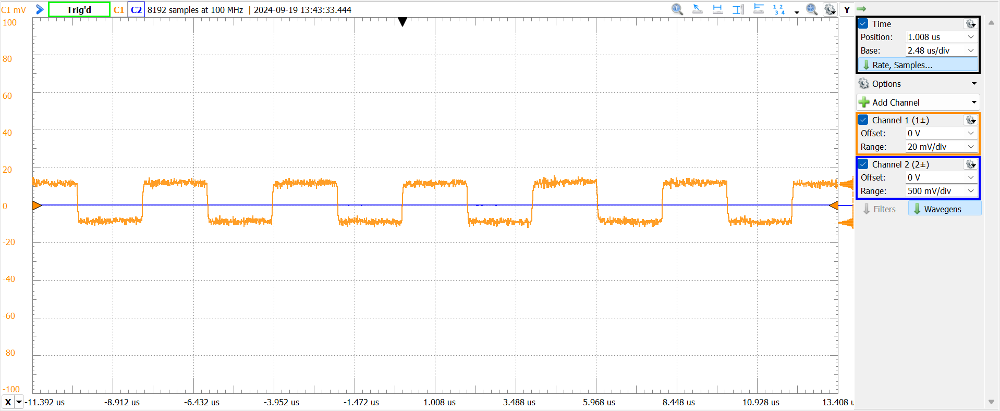

In [67]:
Image("LAB3_13.png")

- From this graph is seems that my prediction was incorrect.
- My next step was to hook up channel 2 to the w1 and ground. This allowed me to see both waves overlapping eachother.
  

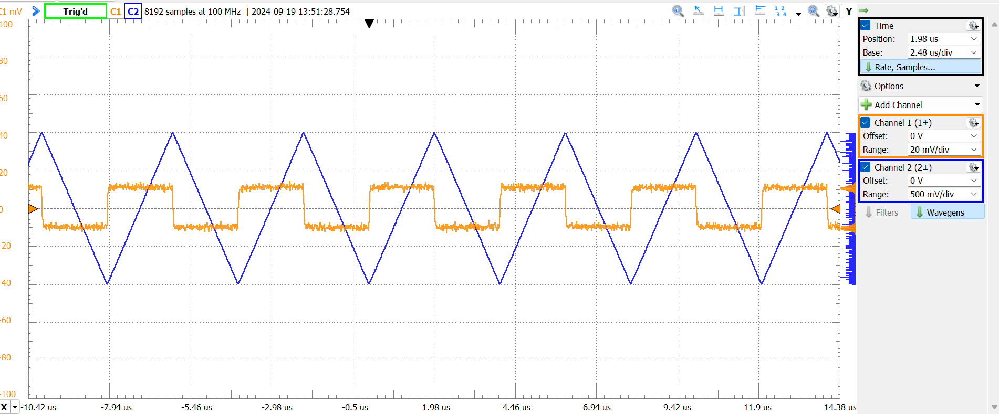

In [70]:
Image("LAB3_14.png")

- On the wavegen tab of Waverforms, it shows the triangle wave peaking at 1.98us (or rougly 2us) instead of 1us.
- The square wave is in fact a differential of the triangle wave here. I can tell because the square is negative when the slope of the T-Wave is negative and the square wave is positive when the slop of the T-wave is positive.
- The channel 2 scope suggests that the actual output of the wavgen is leading by about 1us.
  ### The circuit undoubtly acts as a differentiator. 

### Further Investigation
- I set the wavegen to a period of 5us.
- I set the frequency to 200KHz

#### It turns out that my scope was centered on the v_out instead of the wavegen. The following image shows an easier to read version of my work.


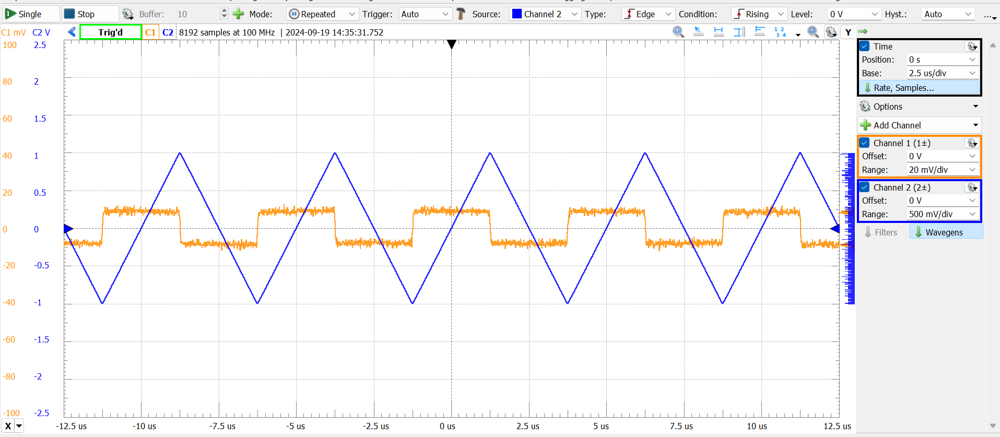

In [74]:
Image("LAB3_15.png")

- Here, it can be seen that the perdiod is still 5us abd that the square qualitively matches the prediction.
- Quantitavely, the positive portion of the triangle wave is 2V/2.5us. That is a slop of .8 MV per second! This does not seem to correlate with what is shown on channel 2.

In [77]:
2/(2.5e-9)

800000000.0

The actual slope on the graph can be found by taking the value of the orange wave and see how long it is. It looks like we have a value of 15mv for the length of 2.5us

## Integrator 

An integrator circuit looks as follows:

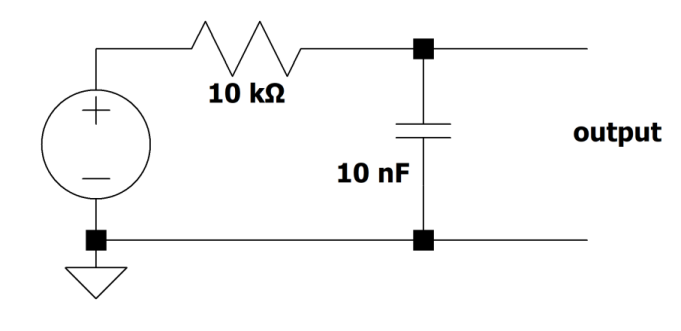

In [82]:
Image("LAB3_12.png")

If the name is accurate, a square wave should look like a triangle wave.


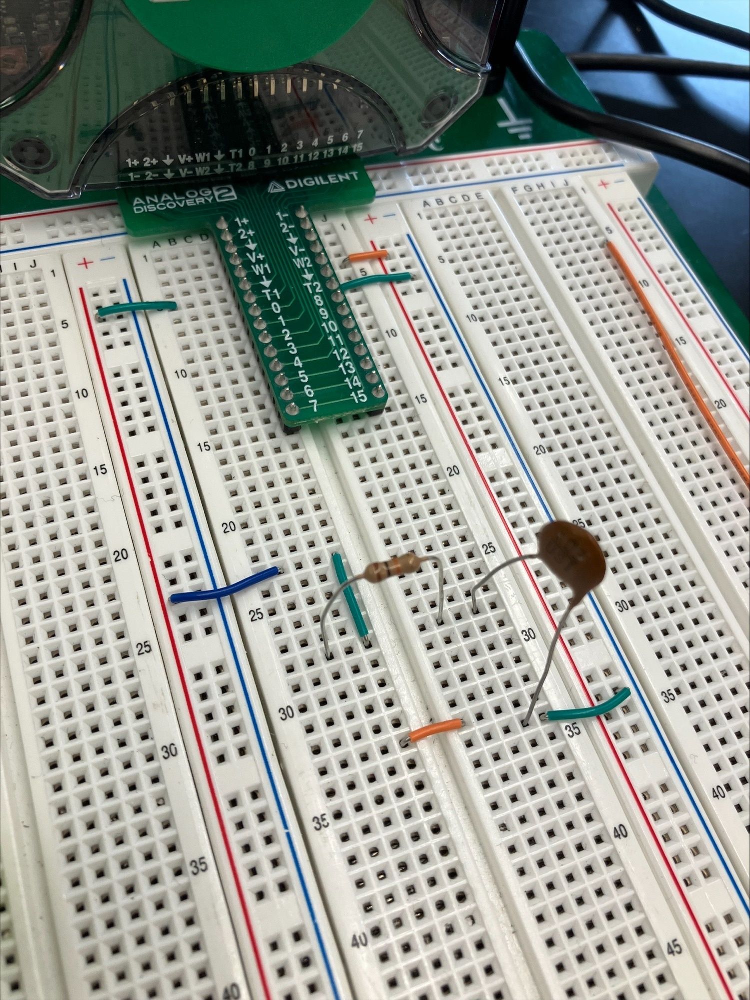

In [34]:
Image("LAB4_CIRC-4.jpeg")

I ran the following square wave:

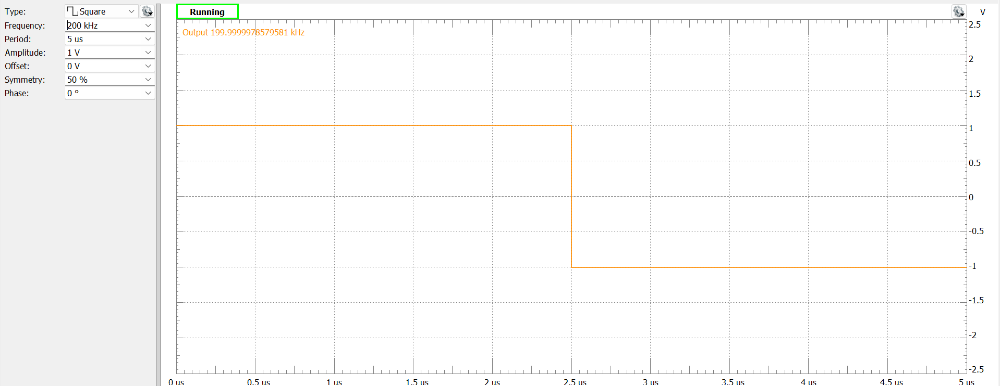

In [87]:
Image("LAB3_16.png")

I got the following results:

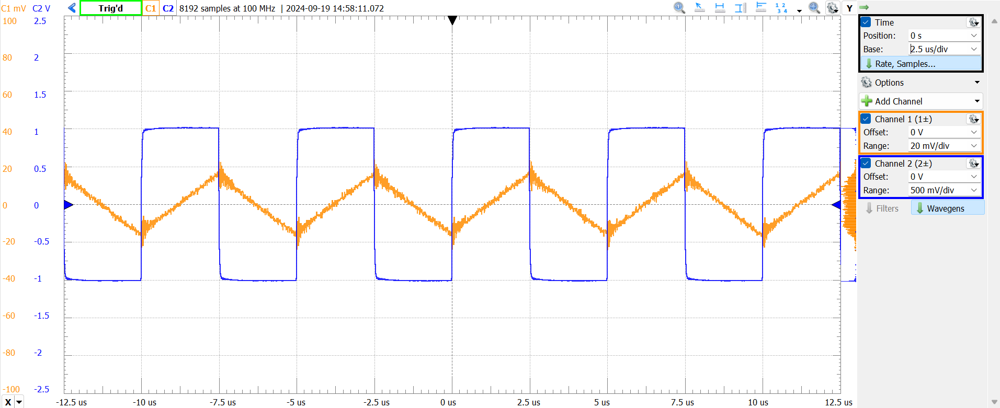

In [90]:
Image("LAB3_17.png")

Once again, it checks out qualitively. When the square wave is positve, the slope of the triangle wave is positive and vise-versa. 
Next I want to try it with a sin wave. The follwing scop should have two sinusoidal waves. When one wave is at a max/min the other is at zero.

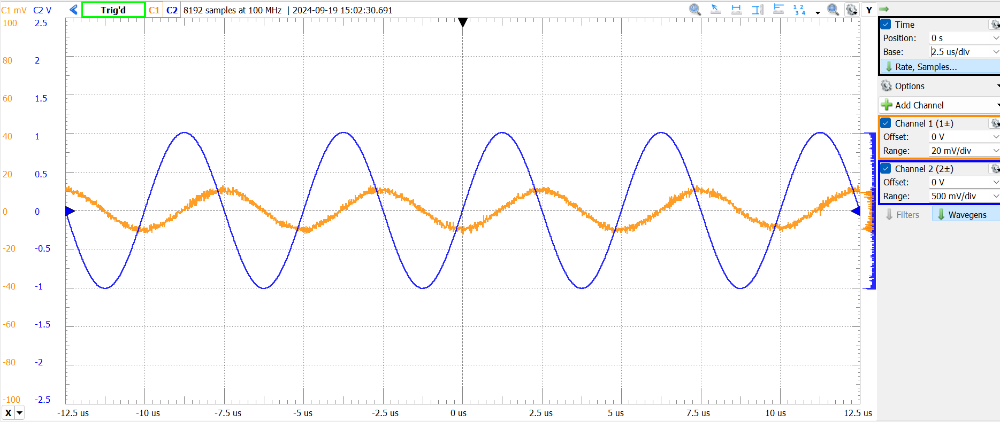

In [93]:
Image("LAB3_18.png")

## Note: the sine wave used the same settings as the previous square wave.

If I run a triangle wave, I get a cosine wave that starts at -10mv (-cosine???)

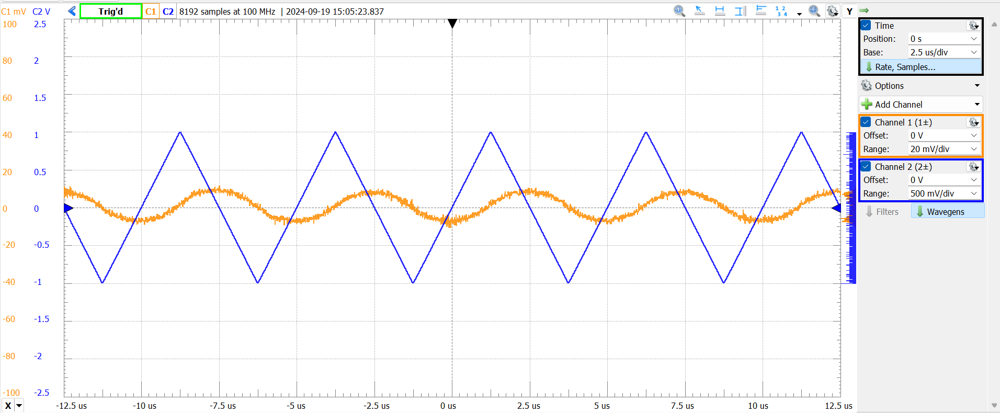

In [97]:
Image("LAB3_19.png")

### The conclusion is that the integrator circuit succseffully turns a generated wave into the integral version of itself. 

# Part 2: Frequency Domain

I constructed the low pass filter below.

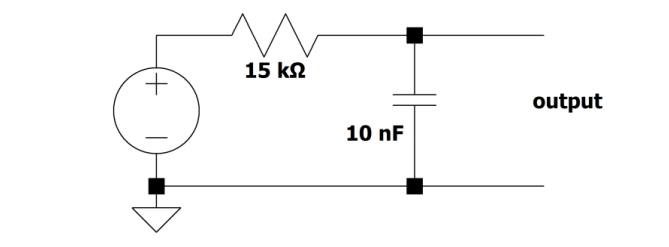

In [102]:
Image("LAB3_20.png")

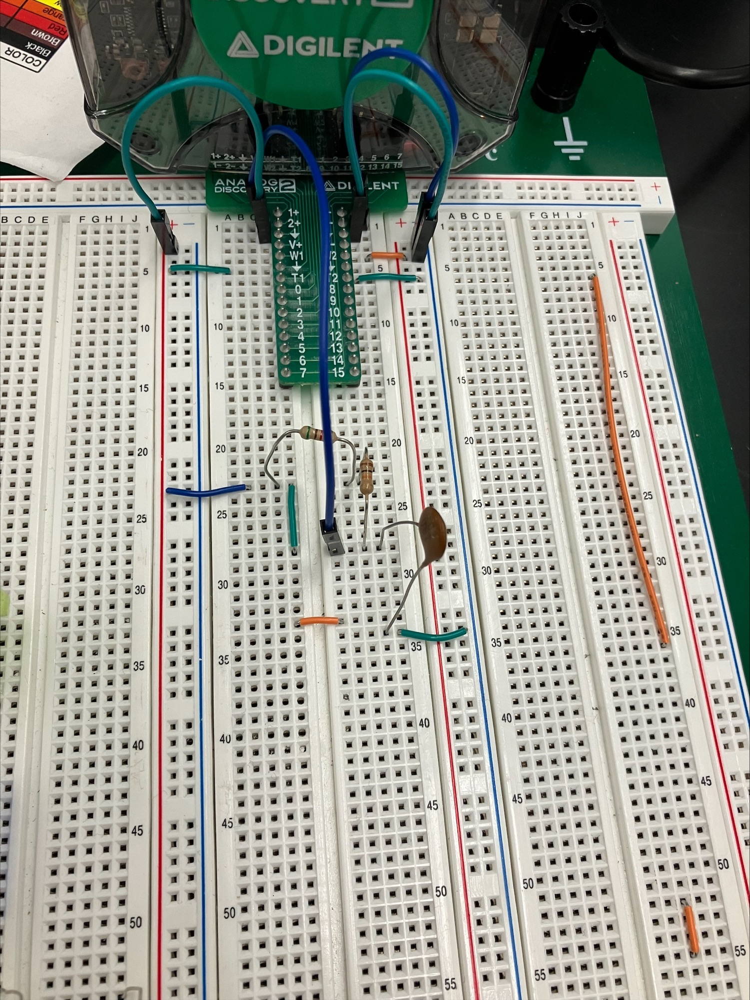

In [46]:
Image("LAB4_CIRC-5.jpeg")

In [104]:
b = 2 * math.pi * 10

In [106]:
a = 150

In [108]:
(1/(a*b))

0.0001061032953945969

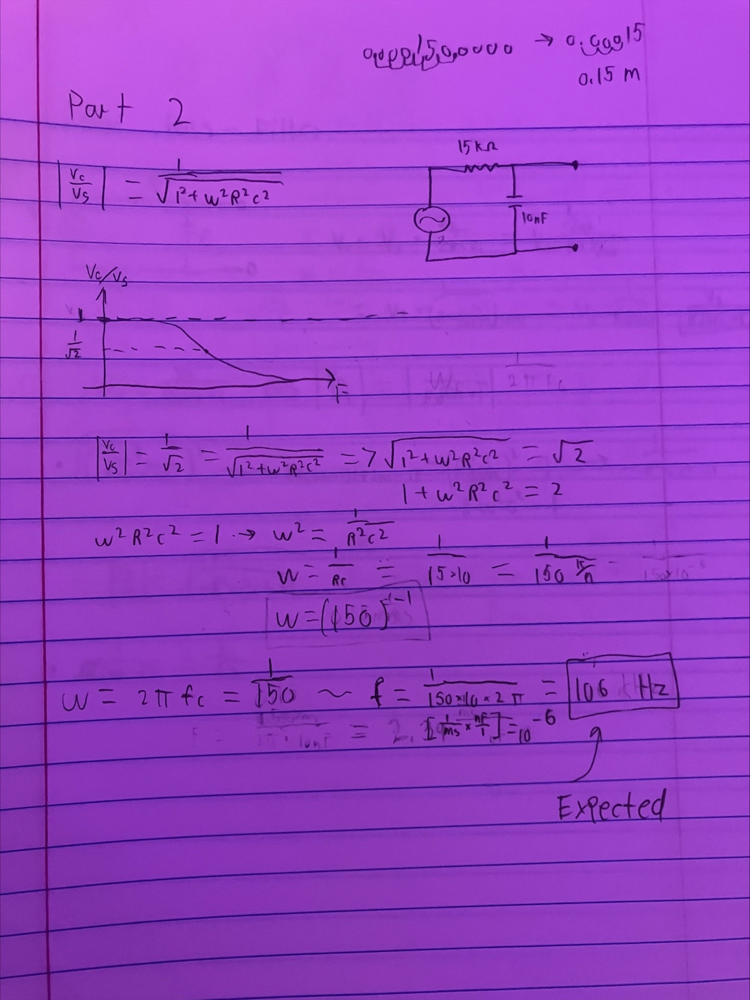

In [53]:
Image("LB3.jpeg")

### Note: The expected value is actually 1.06 kHz.

### Note: Filters should have two grapsh two them. The Attenuation(dB) and Phase(degrees).

The low pass filter should allow low frequencies through block block the voltage when the frequency gets higher. 

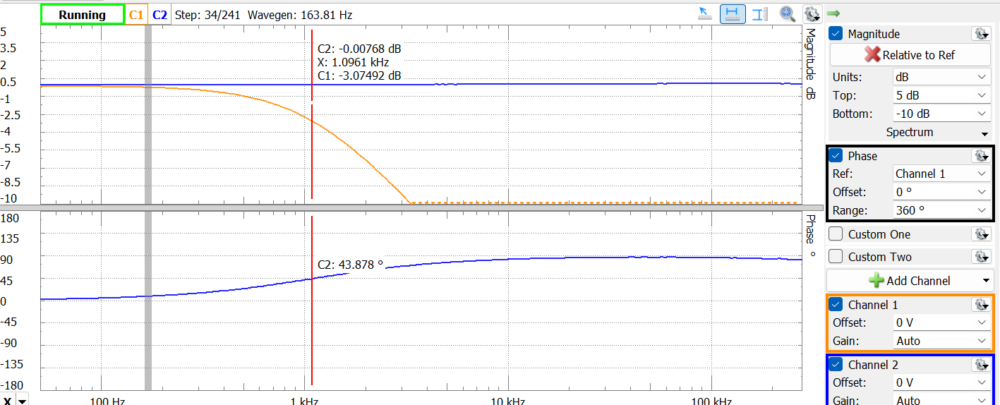

In [113]:
Image("LAB3_21.png")

Here it can seen. The DB of channel one drops as the frequency gets higher.

The next part of the lab is to use the low-pass filter to smooth out a noisy signal. To do this we ran a custom signal called "sine_plus_noise"

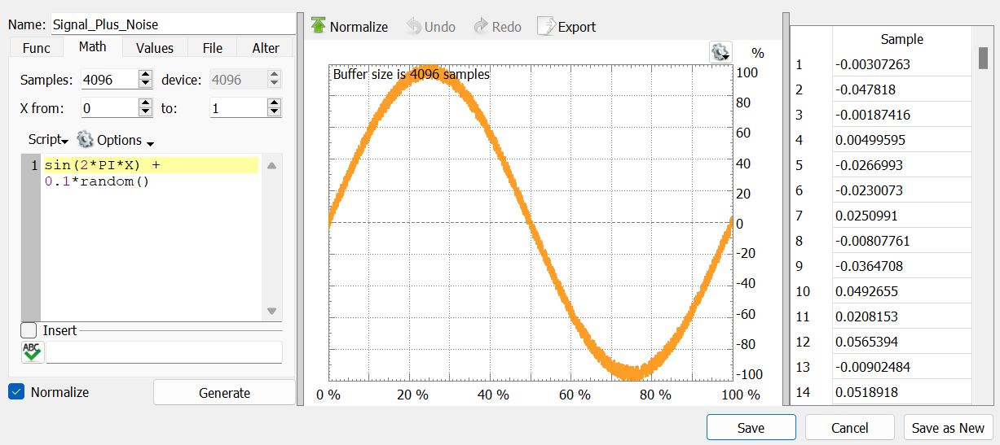

In [117]:
Image("LAB3_22.png")

I then ran the wave at a low frequency of 200 Hz. I get the following scope.

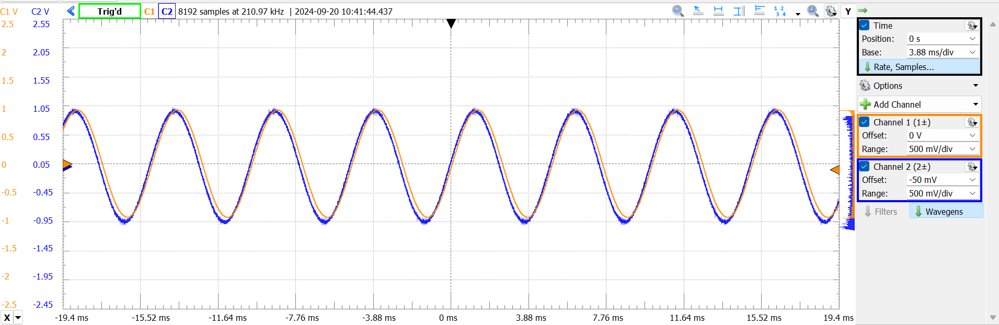

In [120]:
Image("LAB3_23.png")

The scope for the capacitor is much smoother than the wavegen for a 200 Hz sine wave. 
Next I want to see if it does the same for a high-pass filter. As the frequency gets higher, the filter should let less through. I have no prediction for this.

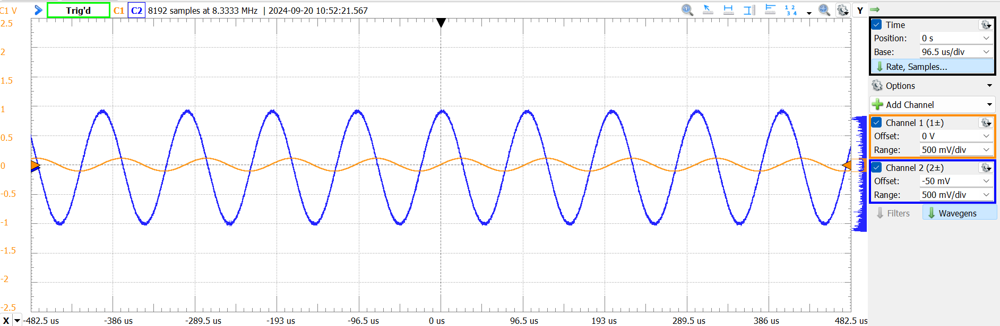

In [123]:
Image("LAB3_25.png")

This is interesting. By running a high frequency, the output seems to have flattened and is now shifted away from the generated wave.

### High Pass Filter
Lasty I contructed a High pass filter. Once again, the cutoff frequency will be where the dB is -3. 

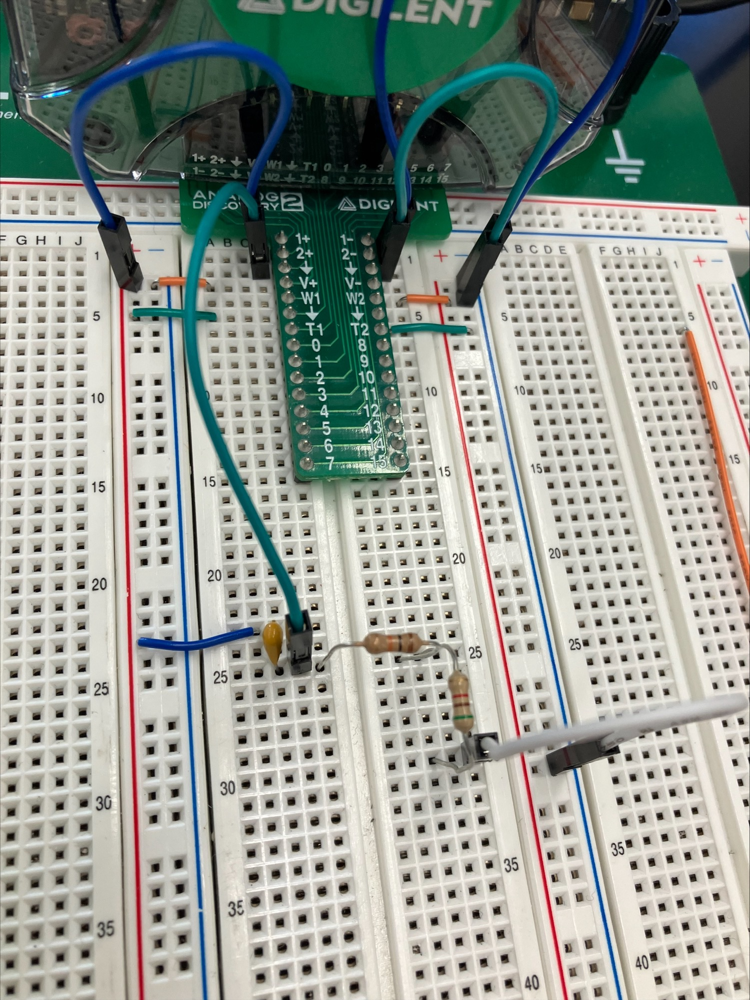

In [48]:
Image("LAB4_CIRC-7.jpeg")

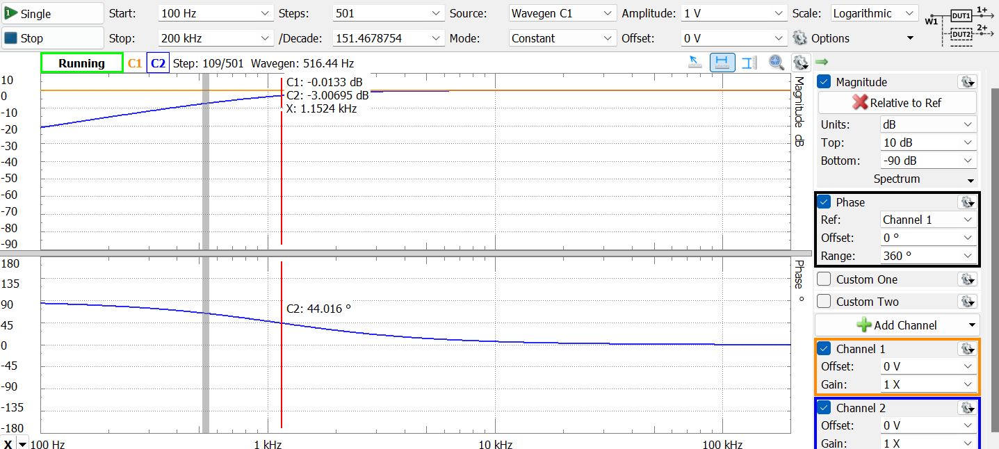

In [132]:
Image("LAB3_26.png")

Here, you can see that the cutoff frequency is about 1.1524 kHz. Next I want to see if I can recreate this result with math.

In [ ]:
azGhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhasc %^33333333333333333333333333333333333333333333333333333CCCCCCCCCCCCCCCCCCC222222222222222222222222222222222222222222222S CRT                                                                                                                                                                                                                                                                                                                         ;HHHHNZZ TJJJJZrRYYFM 1QQQQQQQQQQQQQQQ2CDDDDNMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMM BG67NFRRRRRRRRRRRRRRRRRRRMMMMMMMMMMMMNNNN

The cut off frequency was calculated with the equation below.

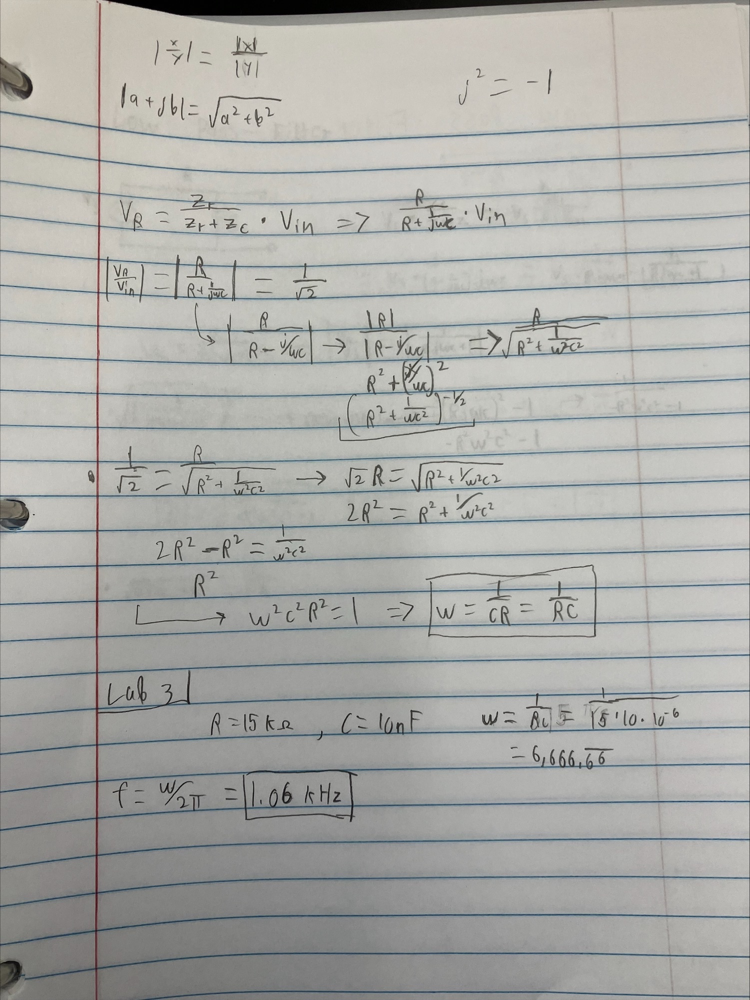

In [58]:
Image("LAB3_27.jpeg")